In [4]:
!git clone https://github.com/ClementPla/fundus-lesions-toolkit.git

fatal: destination path 'fundus-lesions-toolkit' already exists and is not an empty directory.


In [5]:
cd /content/fundus-lesions-toolkit


/content/fundus-lesions-toolkit


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!pip install .

Processing /content/fundus-lesions-toolkit
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/ClementPla/fundus-data-toolkit to /tmp/pip-install-bvguw1kw/fundus-data-toolkit_7f9a114471434af7840051b6b84efa21
  Running command git clone --filter=blob:none --quiet https://github.com/ClementPla/fundus-data-toolkit /tmp/pip-install-bvguw1kw/fundus-data-toolkit_7f9a114471434af7840051b6b84efa21
  Resolved https://github.com/ClementPla/fundus-data-toolkit to commit a26d28c8efa99d2dde560c33bc82aa726ff5aabd
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/ClementPla/NNTools (to revision attrs_dataset) to /tmp/pip-install-bvguw1kw/nntools_37002a23e0274794a57c2340317658c6
  Running command git clone --filter=blob:none --quiet https://github.com/ClementPla/NNTools /tmp/pip-i

In [8]:
from lesion_counting_myp.segmentation import segment, list_models
from lesion_counting_myp.visualization import plot_image, plot_image_and_mask
from lesion_counting_myp.functional import open_image
from lesion_counting_myp.constants import (
    DEFAULT_COLORS,
    LESIONS,
    Dataset,
    lesions2names,
)

sucessful

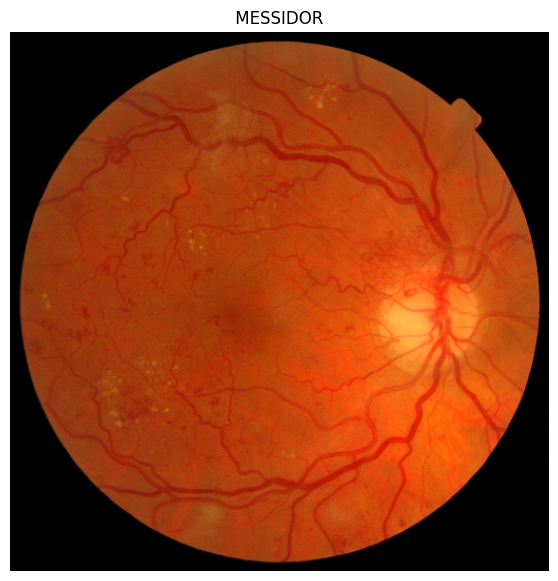

In [17]:
example_path11 = "/content/drive/MyDrive/FYDP/Datasets/messidor-2/messidor-2/messidor-2/preprocess/20051020_45110_0100_PP.png"
img11 = open_image(example_path11)
fsize = (7, 7)
plot_image(img11, title=" MESSIDOR ", figsize=fsize)

**Trained On IDRiD Dataset**

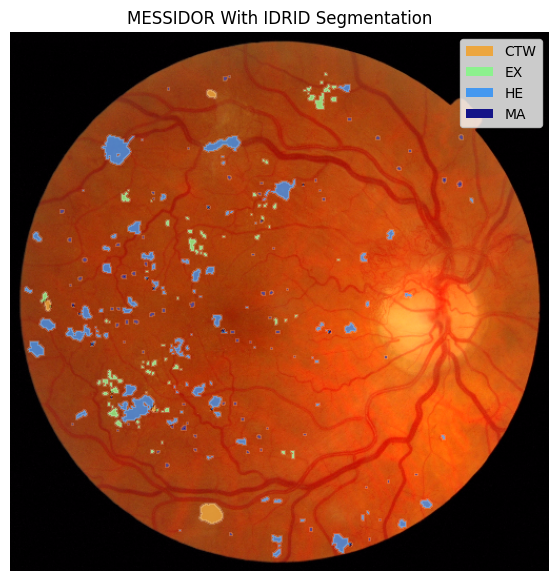

Number of Cotton Wool Spots: 4
Number of Exudates: 24
Number of Hemorrhages: 48
Number of Microaneurysms: 3


In [18]:
import torch
from kornia.contrib import connected_components

pred11 = segment(img11, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img11,
    pred11,
    alpha=0.8,
    title=f"MESSIDOR With IDRID Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred11, dim=0)

SIZE_THRESHOLD = 10

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained On All Datasets**


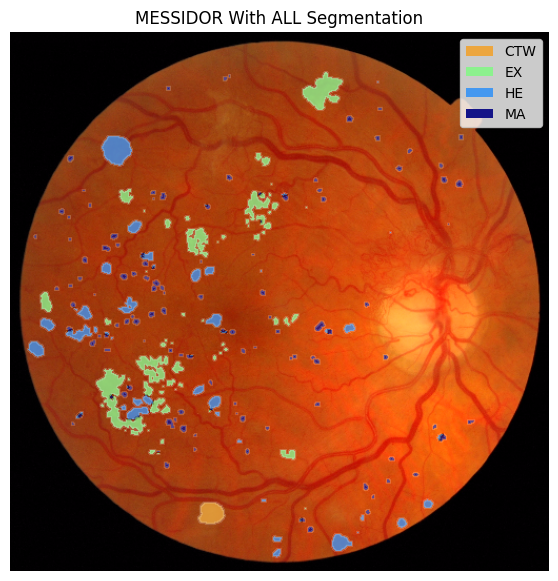

Number of Cotton Wool Spots: 1
Number of Exudates: 31
Number of Hemorrhages: 30
Number of Microaneurysms: 55


In [19]:
import torch
from kornia.contrib import connected_components

pred11 = segment(img11, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img11,
    pred11,
    alpha=0.8,
    title=f"MESSIDOR With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred11, dim=0)

SIZE_THRESHOLD = 10

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained On All Datasets**

In [20]:
import torch
from kornia.contrib import connected_components

pred2 = segment(img2, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img2,
    pred2,
    alpha=0.8,
    title=f"APTOS With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred2, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

NameError: name 'img2' is not defined

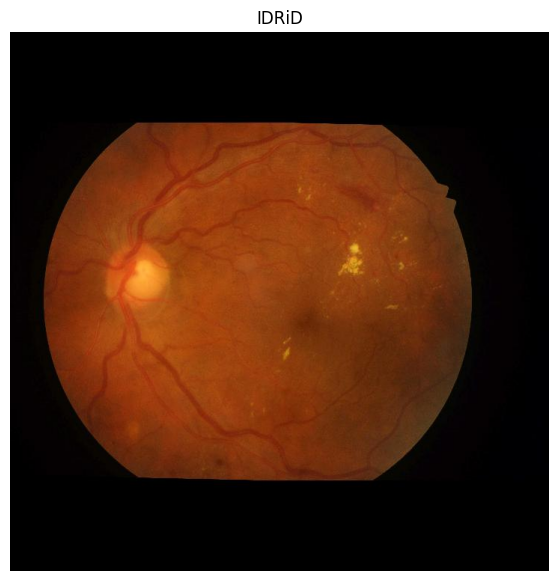

In [13]:
example_path = "/content/drive/MyDrive/FYDP/Datasets/DR_subset/Processed_Images/RDR_Cropped/autofit_idrid_2_level_2_IDRiD_072_shearupdated_again14.jpg"
img = open_image(example_path)
fsize = (7, 7)
plot_image(img, title="IDRiD", figsize=fsize)

**Trained on IDRID Dataset**

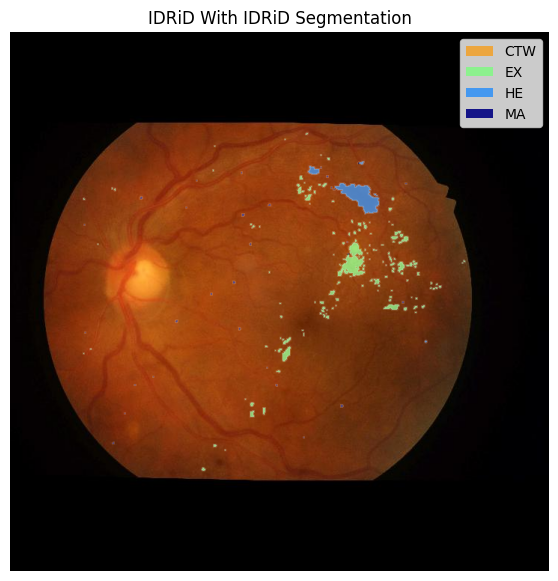

Number of Cotton Wool Spots: 0
Number of Exudates: 34
Number of Hemorrhages: 3
Number of Microaneurysms: 0


In [14]:
import torch
from kornia.contrib import connected_components

pred = segment(img, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img,
    pred,
    alpha=0.8,
    title=f"IDRiD With IDRiD Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred, dim=0)

SIZE_THRESHOLD = 10

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained on All Datasets**

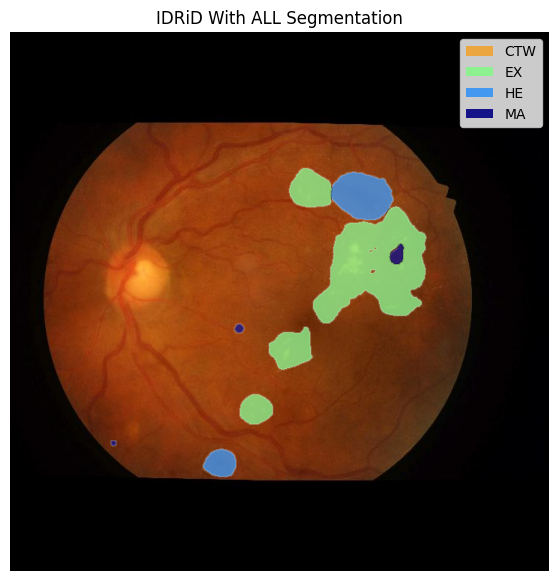

Number of Cotton Wool Spots: 0
Number of Exudates: 57
Number of Hemorrhages: 2
Number of Microaneurysms: 3


In [15]:
import torch
from kornia.contrib import connected_components

pred = segment(img, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img,
    pred,
    alpha=0.8,
    title=f"IDRiD With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred, dim=0)

SIZE_THRESHOLD = 10

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

successful

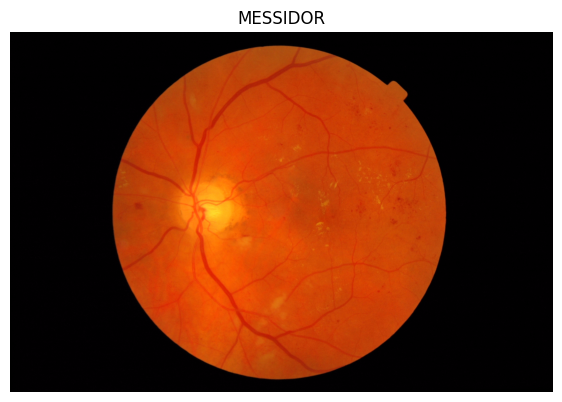

In [10]:
example_path1 = "/content/drive/MyDrive/FYDP/Datasets/DR_subset/train/Rdr/IM0265_extra_shear0.png"
img1 = open_image(example_path1)
fsize = (7, 7)
plot_image(img1, title="MESSIDOR", figsize=fsize)

**Trained on IDRiD Dataset**

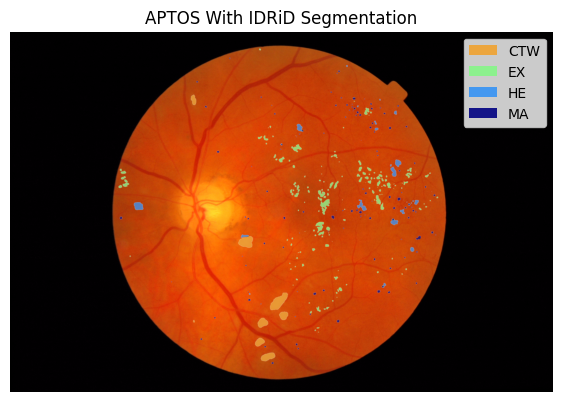

Number of Cotton Wool Spots: 8
Number of Exudates: 117
Number of Hemorrhages: 23
Number of Microaneurysms: 81


In [11]:
import torch
from kornia.contrib import connected_components

pred1 = segment(img1, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img1,
    pred1,
    alpha=0.8,
    title=f"APTOS With IDRiD Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred1, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained on All Datasets**

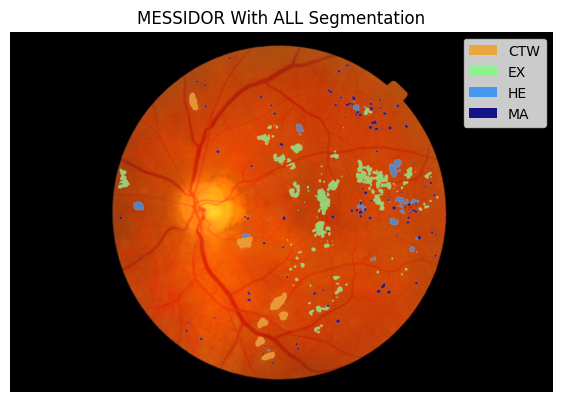

Number of Cotton Wool Spots: 7
Number of Exudates: 97
Number of Hemorrhages: 20
Number of Microaneurysms: 105


In [180]:
import torch
from kornia.contrib import connected_components

pred1 = segment(img1, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img1,
    pred1,
    alpha=0.8,
    title=f"MESSIDOR With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred1, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

successful

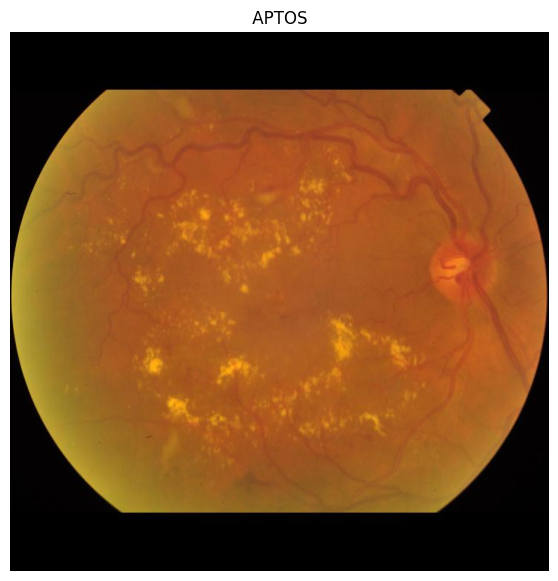

In [165]:
example_path2 = "/content/drive/MyDrive/FYDP/Datasets/DR_subset/Processed_Images/RDR_Cropped/autofit_Aptos_19_2_4f46d7ee61ed.jpg"
img2 = open_image(example_path2)
fsize = (7, 7)
plot_image(img2, title=" APTOS ", figsize=fsize)

**Trained On IDRID Dataset**

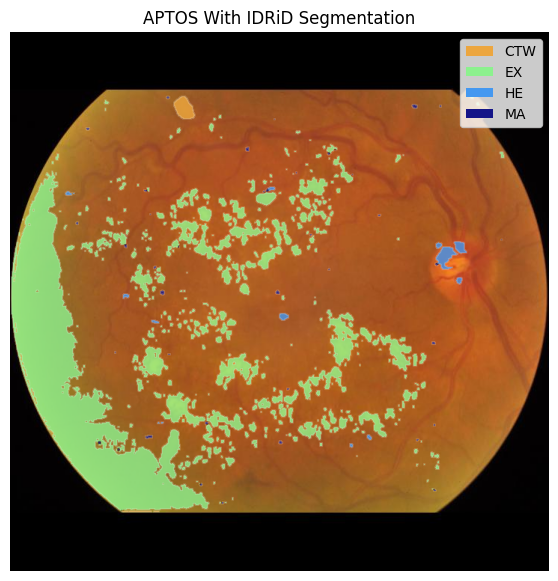

Number of Cotton Wool Spots: 2
Number of Exudates: 514
Number of Hemorrhages: 11
Number of Microaneurysms: 5


In [181]:
import torch
from kornia.contrib import connected_components

pred2 = segment(img2, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img2,
    pred2,
    alpha=0.8,
    title=f"APTOS With IDRiD Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred2, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

successful

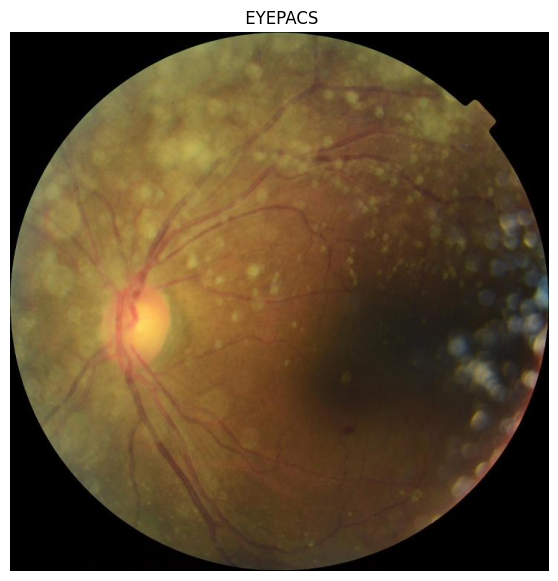

In [169]:
example_path3 = "/content/drive/MyDrive/FYDP/Datasets/DR_subset/Processed_Images/RDR_Cropped/autofit_eyepacs_2_685_left..jpg"
img3 = open_image(example_path3)
fsize = (7, 7)
plot_image(img3, title=" EYEPACS", figsize=fsize)

**Trained On IDRiD Dataset**

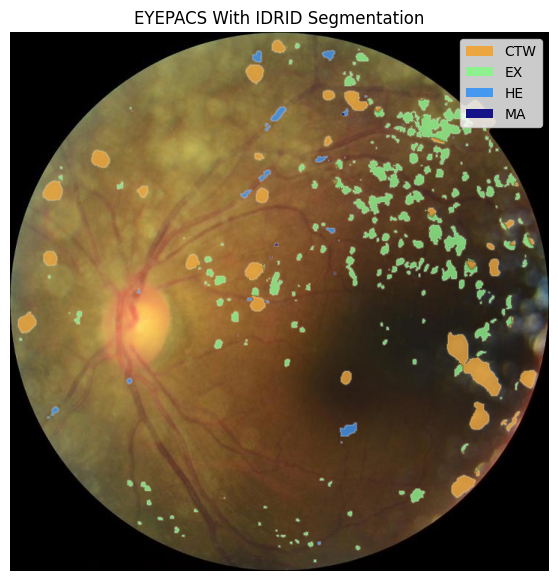

Number of Cotton Wool Spots: 34
Number of Exudates: 125
Number of Hemorrhages: 13
Number of Microaneurysms: 0


In [170]:
import torch
from kornia.contrib import connected_components

pred3 = segment(img3, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img3,
    pred3,
    alpha=0.8,
    title=f"EYEPACS With IDRID Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred3, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained On All Datasets**

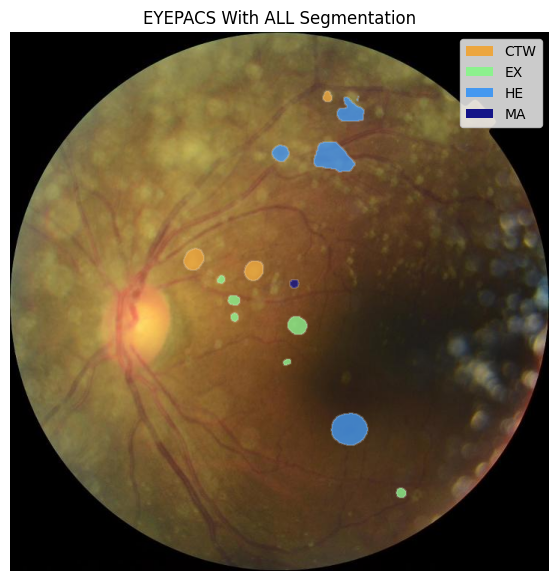

Number of Cotton Wool Spots: 3
Number of Exudates: 6
Number of Hemorrhages: 4
Number of Microaneurysms: 1


In [171]:
import torch
from kornia.contrib import connected_components

pred3 = segment(img3, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img3,
    pred3,
    alpha=0.8,
    title=f"EYEPACS With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred3, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

CONCLUSION:  Since EYEPACS has brightness adjustment issue, therefore it has not been properly segmented.

Successful

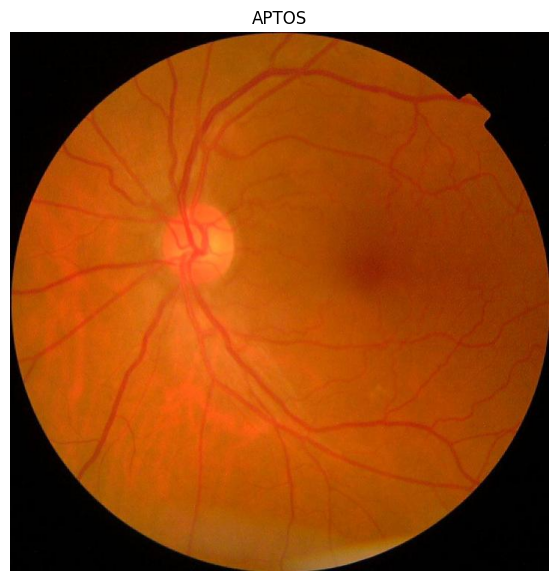

In [ ]:
example_path4 = "/content/drive/MyDrive/FYDP/Datasets/DR_subset/Processed_Images/NRDR_Cropped/autofit_Aptos_19_0_5c85d22bd0de.jpg"
img4 = open_image(example_path4)
fsize = (7, 7)
plot_image(img4, title="APTOS", figsize=fsize)

**Trained On IDRiD Dataset**

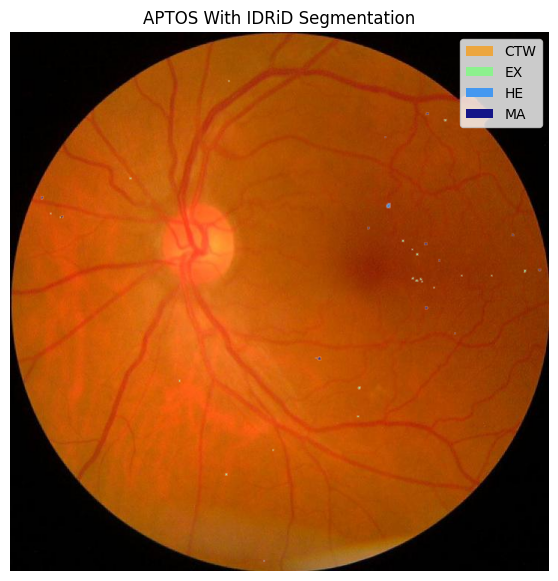

Number of Cotton Wool Spots: 0
Number of Exudates: 0
Number of Hemorrhages: 1
Number of Microaneurysms: 1


In [ ]:
import torch
from kornia.contrib import connected_components

pred4 = segment(img4, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img4,
    pred4,
    alpha=0.8,
    title=f"APTOS With IDRiD Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred4, dim=0)

SIZE_THRESHOLD = 10

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained On ALL Datasets**

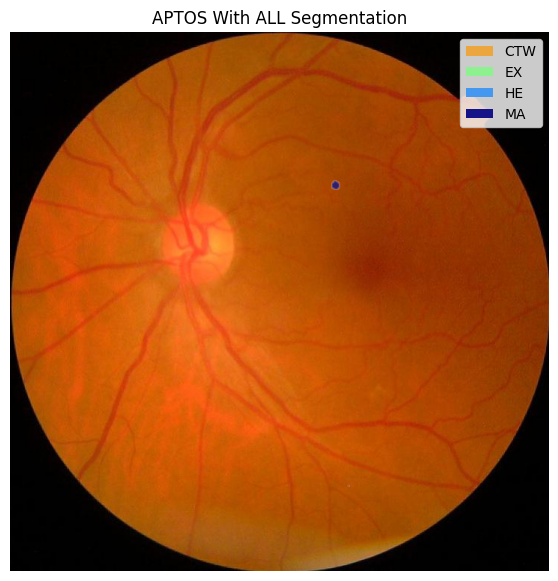

Number of Cotton Wool Spots: 0
Number of Exudates: 0
Number of Hemorrhages: 0
Number of Microaneurysms: 1


In [ ]:
import torch
from kornia.contrib import connected_components

pred4 = segment(img4, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img4,
    pred4,
    alpha=0.8,
    title=f"APTOS With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred4, dim=0)

SIZE_THRESHOLD = 10

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

successful

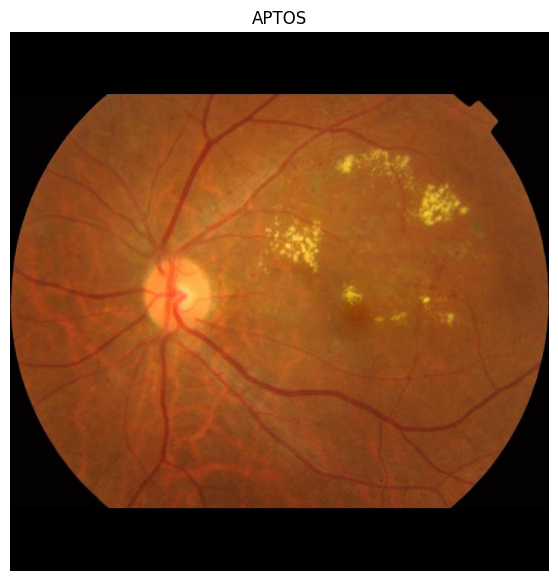

In [ ]:
example_path5 = "/content/drive/MyDrive/FYDP/Datasets/DR_subset/Processed_Images/RDR_Cropped/autofit_Aptos_19_2_8cb6b0efaaac.jpg"
img5 = open_image(example_path5)
fsize = (7, 7)
plot_image(img5, title="APTOS", figsize=fsize)

**Trained On IDRiD Dataset**

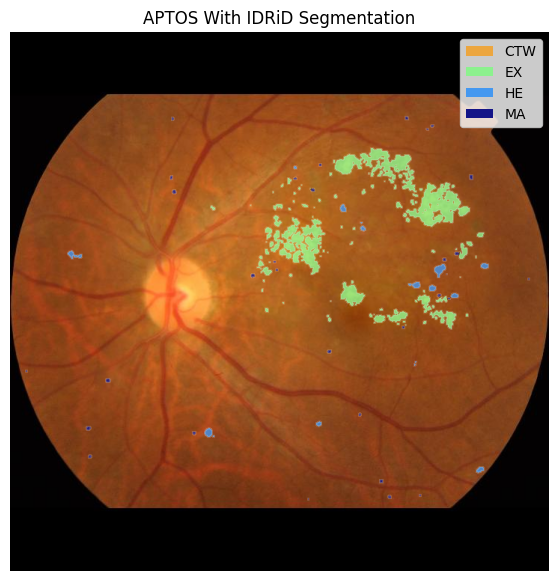

Number of Cotton Wool Spots: 0
Number of Exudates: 45
Number of Hemorrhages: 11
Number of Microaneurysms: 9


In [ ]:
import torch
from kornia.contrib import connected_components

pred5 = segment(img5, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img5,
    pred5,
    alpha=0.8,
    title=f"APTOS With IDRiD Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred5, dim=0)

SIZE_THRESHOLD =15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained On ALL Datasets**

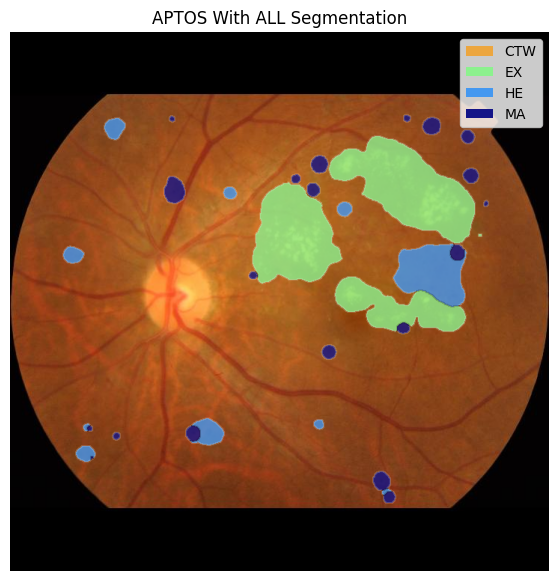

Number of Cotton Wool Spots: 0
Number of Exudates: 148
Number of Hemorrhages: 10
Number of Microaneurysms: 19


In [ ]:
import torch
from kornia.contrib import connected_components

pred5 = segment(img5, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img5,
    pred5,
    alpha=0.8,
    title=f"APTOS With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)
discrete_prediction = torch.argmax(pred5, dim=0)

SIZE_THRESHOLD =15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

successful

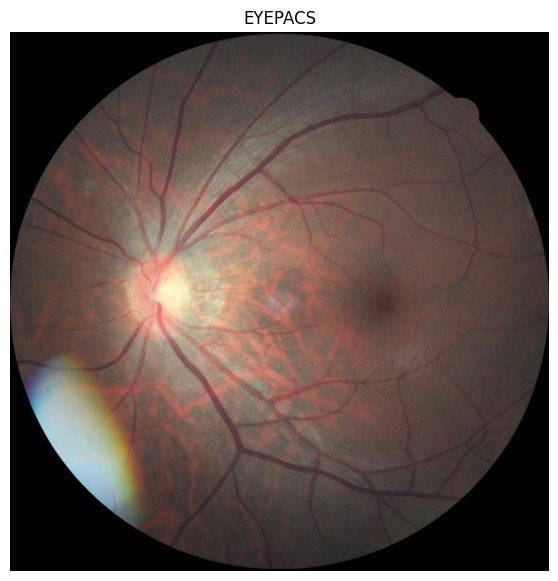

In [ ]:
example_path6 = "/content/drive/MyDrive/FYDP/Datasets/DR_subset/Processed_Images/NRDR_Cropped/autofit_eyepacs_0_494_left..jpg"
img6 = open_image(example_path6)
fsize = (7, 7)
plot_image(img6, title="EYEPACS", figsize=fsize)


**Trained On IDRiD Dataset**

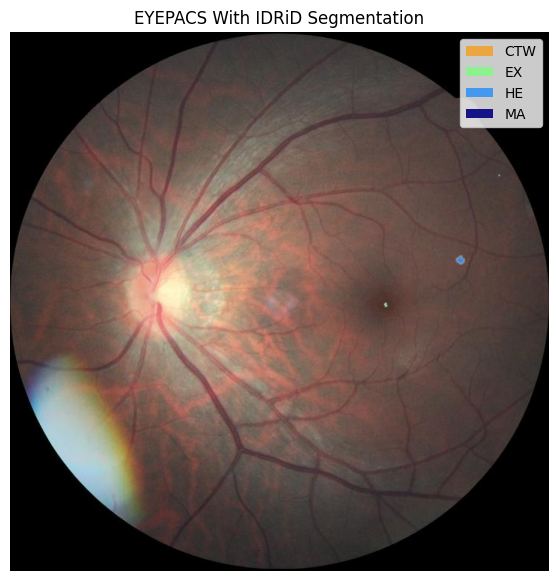

Number of Cotton Wool Spots: 0
Number of Exudates: 0
Number of Hemorrhages: 1
Number of Microaneurysms: 0


In [ ]:
import torch
from kornia.contrib import connected_components

pred6 = segment(img6, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img6,
    pred6,
    alpha=0.8,
    title=f"EYEPACS With IDRiD Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred6, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

CONCLUSION:   AGAIN BRIGHTNESS ISSUE

**Trained On ALL Datasets**

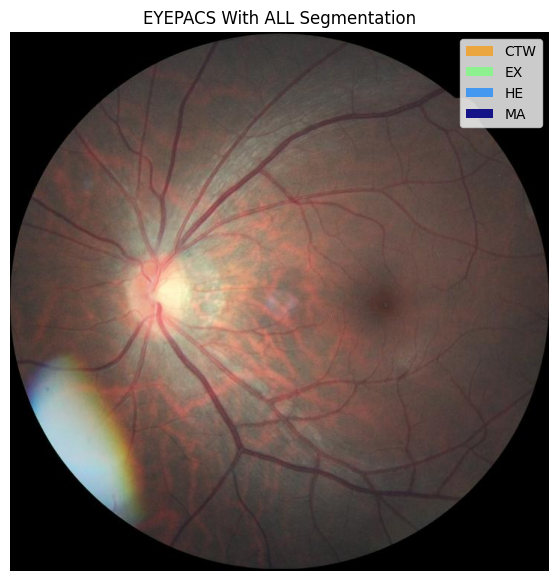

Number of Cotton Wool Spots: 0
Number of Exudates: 0
Number of Hemorrhages: 0
Number of Microaneurysms: 0


In [ ]:
import torch
from kornia.contrib import connected_components

pred6 = segment(img6, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img6,
    pred6,
    alpha=0.8,
    title=f"EYEPACS With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred6, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

successful

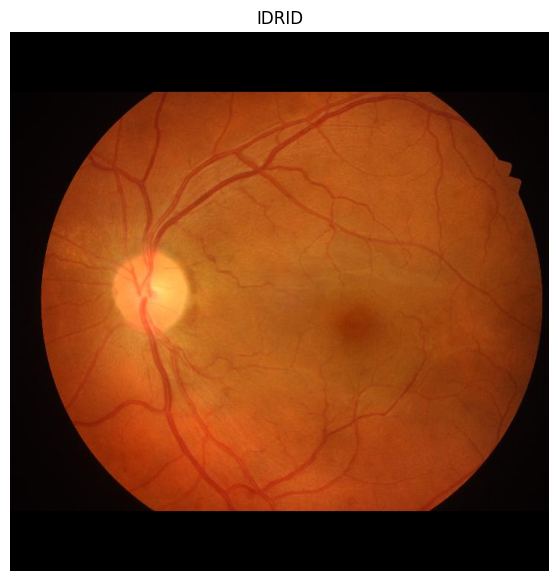

In [ ]:
example_path7 = "/content/drive/MyDrive/FYDP/Datasets/DR_subset/Processed_Images/NRDR_Cropped/autofit_idrid_0_IDRiD_396.jpg"
img7 = open_image(example_path7)
fsize = (7, 7)
plot_image(img7, title="IDRID", figsize=fsize)

**Trained On IDRiD Dataset**

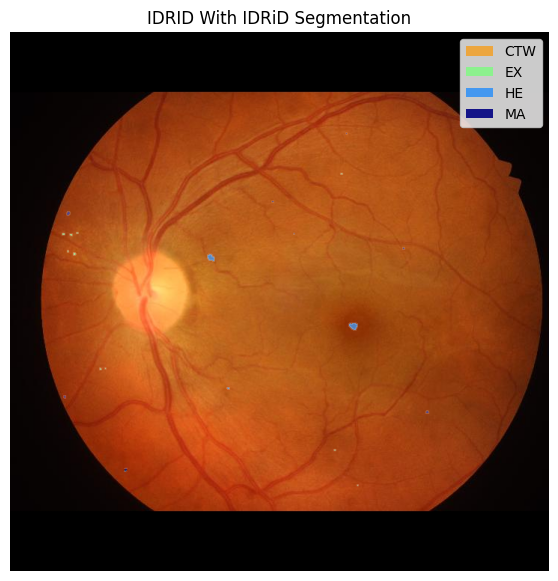

Number of Cotton Wool Spots: 0
Number of Exudates: 0
Number of Hemorrhages: 2
Number of Microaneurysms: 0


In [ ]:
import torch
from kornia.contrib import connected_components

pred7 = segment(img7, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img7,
    pred7,
    alpha=0.8,
    title=f"IDRID With IDRiD Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred7, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained On ALL Datasets**

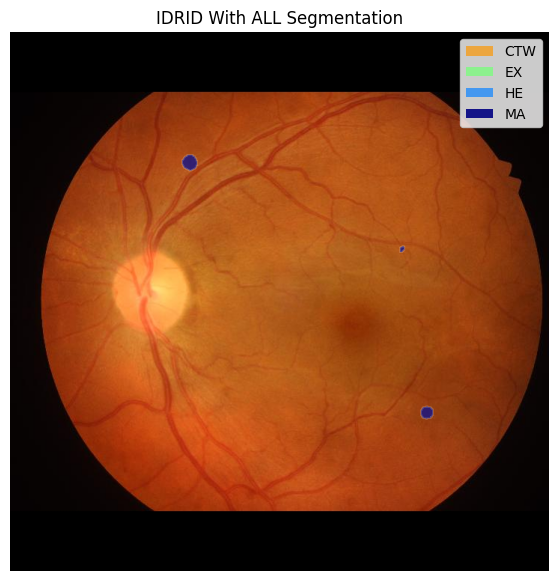

Number of Cotton Wool Spots: 0
Number of Exudates: 0
Number of Hemorrhages: 0
Number of Microaneurysms: 3


In [ ]:
import torch
from kornia.contrib import connected_components

pred7 = segment(img7, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img7,
    pred7,
    alpha=0.8,
    title=f"IDRID With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred7, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

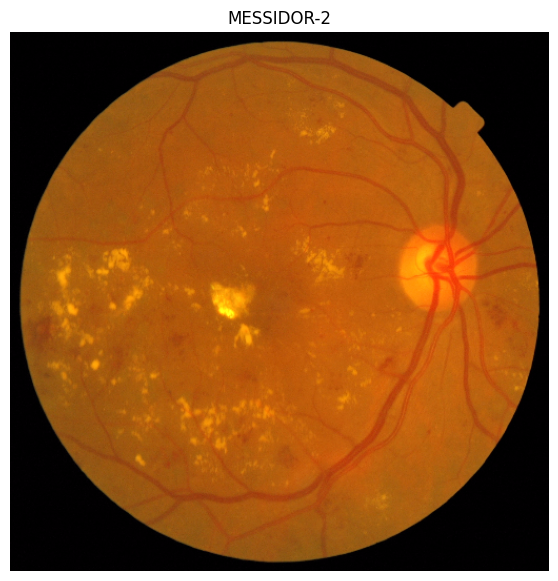

In [ ]:
example_path8 = "/content/drive/MyDrive/FYDP/Datasets/messidor-2/messidor-2/messidor-2/preprocess/20060529_57430_0100_PP.png"
img8 = open_image(example_path8)
fsize = (7, 7)
plot_image(img8, title="MESSIDOR-2", figsize=fsize)

**Trained On IDRiD Dataset**

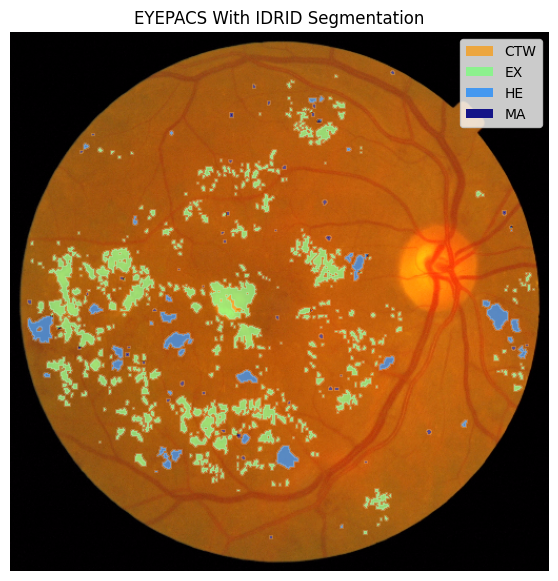

Number of Cotton Wool Spots: 0
Number of Exudates: 109
Number of Hemorrhages: 26
Number of Microaneurysms: 0


In [ ]:
import torch

from kornia.contrib import connected_components

pred8 = segment(img8, device="cpu", train_datasets=Dataset.IDRID, compile=False)
plot_image_and_mask(
    img8,
    pred8,
    alpha=0.8,
    title=f"EYEPACS With IDRID Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred8, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

**Trained On ALL Datasets**

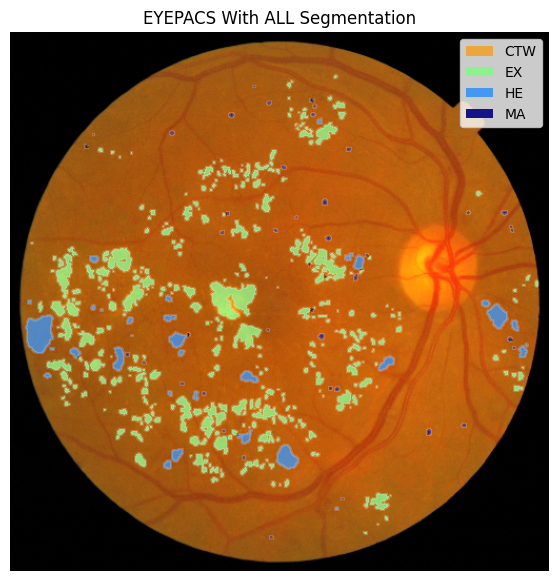

Number of Cotton Wool Spots: 0
Number of Exudates: 130
Number of Hemorrhages: 25
Number of Microaneurysms: 5


In [ ]:
import torch

from kornia.contrib import connected_components

pred8 = segment(img8, device="cpu", train_datasets=Dataset.ALL, compile=False)
plot_image_and_mask(
    img8,
    pred8,
    alpha=0.8,
    title=f"EYEPACS With ALL Segmentation",
    figsize=fsize,
    colors=DEFAULT_COLORS,
    labels=LESIONS,
)

discrete_prediction = torch.argmax(pred8, dim=0)

SIZE_THRESHOLD = 15

for i, lesion in enumerate(LESIONS):
    if i == 0:
        continue

    mask = discrete_prediction == i
    ccl = connected_components(mask.unsqueeze(0).unsqueeze(0).float())

    unique, count = torch.unique(ccl, return_counts=True, sorted=True)
    nb_components = (count > SIZE_THRESHOLD).sum().item() - 1  # -1 to remove background

    print(f"Number of {lesions2names[lesion]}: {nb_components}")

successful